# Bag-of-Features representation for Content Based Image Retrieval
### Marija Brkic, Nikola Dobricic, Dimitrije Zdrale


# I - Data preparation

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
import random
from sklearn.cluster import KMeans

In [4]:
def create_train_test(data_path, class_name, train_ratio=0.85):
    """Split images in a class into train/test based on ratio"""
    directory = data_path + class_name + "/"
    print(f"Browsing directory {directory}")
    data = os.listdir(directory)
    random.shuffle(data)
    
    # Split by ratio instead of fixed numbers
    num_images = len(data)
    train_size = int(num_images * train_ratio)
    
    train = data[:train_size]
    test = data[train_size:]
    
    print(f"  → {len(data)} total: {len(train)} train + {len(test)} test")
    return train, test

class_list = []
data_path = "./CBIR_15-Scene/"
for file in sorted(os.listdir(data_path)):
    if os.path.isdir(data_path+file):
        class_list.append(file)

# Use ALL images with 85/15 split
train_ratio = 0.85
train_set = []
test_set = []
train_set_label = []
test_set_label = []

print("="*70)
print(f"LOADING DATASET WITH {train_ratio:.0%}/{1-train_ratio:.0%} TRAIN/TEST SPLIT")
print("="*70)

for class_name in class_list:
    train, test = create_train_test(data_path, class_name, train_ratio)
    train_set = train_set + train
    test_set = test_set + test
    train_label = [class_name] * len(train)
    test_label = [class_name] * len(test)
    train_set_label = train_set_label + train_label
    test_set_label = test_set_label + test_label

print("="*70)
print("DATASET SPLIT COMPLETE")
print("="*70)
print(f"Training set: {len(train_set)} images ({len(train_set)/sum([len(train_set), len(test_set)]):.1%})")
print(f"Testing set:  {len(test_set)} images ({len(test_set)/sum([len(train_set), len(test_set)]):.1%})")
print(f"Total images: {len(train_set) + len(test_set)}")
print(f"Classes: {len(class_list)}")
print("="*70)

LOADING DATASET WITH 85%/15% TRAIN/TEST SPLIT
Browsing directory ./CBIR_15-Scene/00/
  → 216 total: 183 train + 33 test
Browsing directory ./CBIR_15-Scene/01/
  → 241 total: 204 train + 37 test
Browsing directory ./CBIR_15-Scene/02/
  → 311 total: 264 train + 47 test
Browsing directory ./CBIR_15-Scene/03/
  → 210 total: 178 train + 32 test
Browsing directory ./CBIR_15-Scene/04/
  → 289 total: 245 train + 44 test
Browsing directory ./CBIR_15-Scene/05/
  → 360 total: 306 train + 54 test
Browsing directory ./CBIR_15-Scene/06/
  → 328 total: 278 train + 50 test
Browsing directory ./CBIR_15-Scene/07/
  → 260 total: 221 train + 39 test
Browsing directory ./CBIR_15-Scene/08/
  → 308 total: 261 train + 47 test
Browsing directory ./CBIR_15-Scene/09/
  → 374 total: 317 train + 57 test
Browsing directory ./CBIR_15-Scene/10/
  → 410 total: 348 train + 62 test
Browsing directory ./CBIR_15-Scene/11/
  → 292 total: 248 train + 44 test
Browsing directory ./CBIR_15-Scene/12/
  → 356 total: 302 train + 

# II - Computing local descriptors on training set

EXTRACTING kaze DESCRIPTORS FROM 3804 TRAINING IMAGES
  Processed 500/3804 images...
  Processed 1000/3804 images...
  Processed 1500/3804 images...
  Processed 2000/3804 images...
  Processed 2500/3804 images...
  Processed 3000/3804 images...
  Processed 3500/3804 images...
DESCRIPTOR EXTRACTION COMPLETE
Total descriptors extracted: 1,317,969
Descriptor dimension: 64
Descriptor type: float32
Images processed: 3803/3804
Average descriptors per image: 346.6
Total time: 110.99 seconds
Average time per image: 29.18 ms


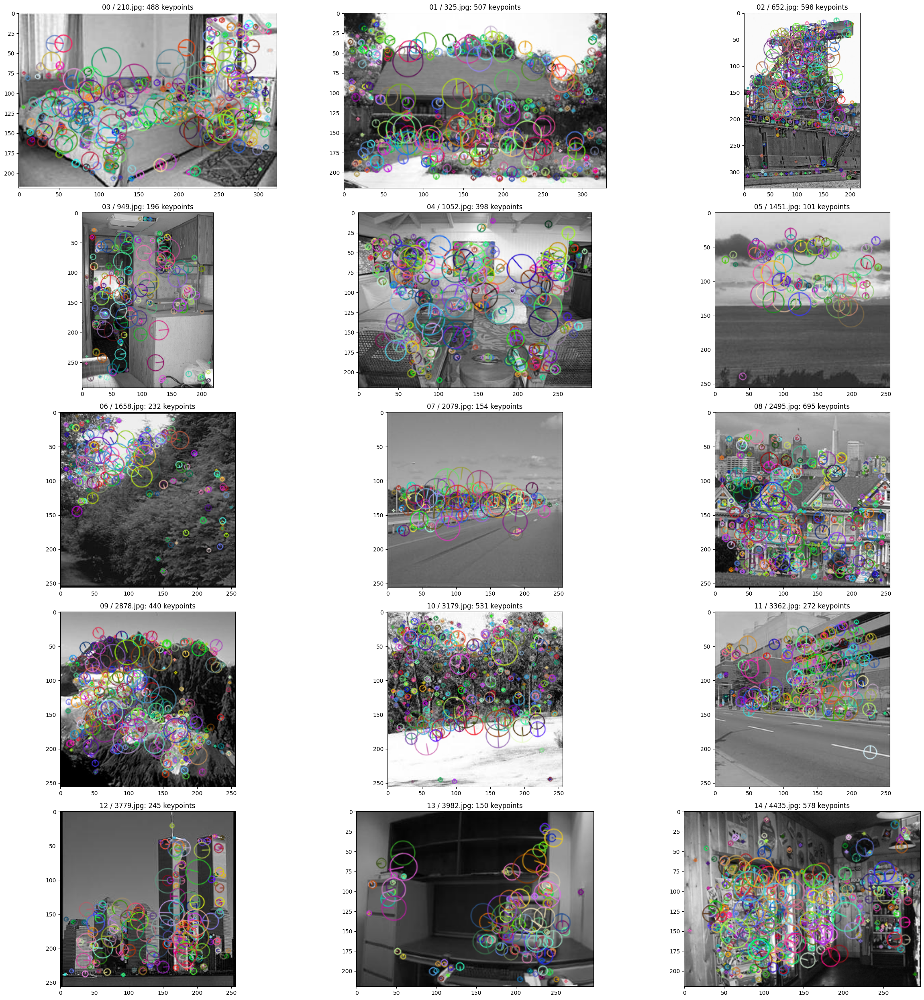

In [5]:
# Choose the keypoint method
method = "kaze"
if (method == "kaze"):
    kp = cv2.KAZE_create(upright = False,
                         threshold = 0.001,
                         nOctaves = 4,
                         nOctaveLayers = 4,
                         diffusivity = 2)
elif (method == "orb"):  
        kp = cv2.ORB_create(nfeatures = 200,
                            scaleFactor = 2,
                            nlevels = 3)

print("="*70)
print(f"EXTRACTING {method} DESCRIPTORS FROM {len(train_set)} TRAINING IMAGES")
print("="*70)

f, disp_array = plt.subplots(5,3,figsize=(25,25))
old_label = "FIRST"
[lig, col] = [0,0]
t1 = cv2.getTickCount()

# Initialize as empty list, will concatenate at the end
all_descriptors = []

for i in range(len(train_set)):
    img_file = data_path + train_set_label[i] + "/" + train_set[i]
    img = cv2.imread(img_file)
    
    if img is None:
        print(f"Warning: Could not read image {img_file}")
        continue
    
    pts, desc = kp.detectAndCompute(img, mask=None)
    
    # Skip images with no keypoints
    if desc is not None and len(desc) > 0:
        all_descriptors.append(desc)
    else:
        print(f"Warning: No keypoints found in image {i}: {train_set[i]}")
    
    # Display keypoints for first image of each class
    img_disp = cv2.drawKeypoints(img, pts, None, flags=4)
    if (train_set_label[i] != old_label):
        old_label = train_set_label[i]
        disp_array[lig,col].imshow(img_disp)
        nb_kp = str(len(pts)) if pts else "0"
        disp_array[lig,col].title.set_text(train_set_label[i] + " / " + train_set[i] + ": " + nb_kp + " keypoints")
        col = col + 1
        if (col == 3):
            [lig,col] = [lig+1,0]
    
    # Progress indicator
    if (i + 1) % 500 == 0:
        print(f"  Processed {i+1}/{len(train_set)} images...")

t2 = cv2.getTickCount()
time = (t2 - t1) / cv2.getTickFrequency()

# Concatenate all descriptors
descriptors_dataset = np.vstack(all_descriptors)
# NICE PRINTS
print("="*70)
print("DESCRIPTOR EXTRACTION COMPLETE")
print("="*70)
print(f"Total descriptors extracted: {descriptors_dataset.shape[0]:,}")
print(f"Descriptor dimension: {descriptors_dataset.shape[1]}")
print(f"Descriptor type: {descriptors_dataset.dtype}")
print(f"Images processed: {len(all_descriptors)}/{len(train_set)}")
print(f"Average descriptors per image: {descriptors_dataset.shape[0]/len(all_descriptors):.1f}")
print(f"Total time: {round(time, 2)} seconds")
print(f"Average time per image: {round((1000*time)/len(train_set), 2)} ms")
print("="*70)

plt.tight_layout()
plt.show()

### QUESTION:  explain and justify the principles of the detector and descriptor you use

Answer:

Here, we can toggle between the ORB and KAZE detectors:

1) KAZE - performs anisotropic diffusion on the image and then finds the local maxima of the determinant of the Hessian matrix of the computed diffused space.
It is an accurate algorithm with solid stability, albeit slower than some others. We chose KAZE because we have enough time and would prefer to focus on performance of the algorithm.
2) ORB - a way faster detector that utilizes the FAST corner detector and an assigned characteristic orientation. It is a solid detector algorithm, and we would choose it if we had to work with real-time data.

As for descriptors:

1) KAZE - computes the gradient magnitude and direction on a discretized nonlinear scale space, making it robust to scale, rotation, and very good at describing textures/edges. This is why we chose this descriptor and detector pair.
2) ORB - when selected in the code uses actually a descriptor called rBRIEF, which samples a patch around a detected point compares pixel intensity, which is faster than gradient computation, and does a description like that. It is faster than KAZE, but sacrifices some discriminative power.


# III - Dictionary creation (here K-Means Clustering)

In [6]:
Number_words = 800
t1 = cv2.getTickCount()
kmeans = KMeans(n_clusters = Number_words,init = 'random').fit(descriptors_dataset)
t2 = cv2.getTickCount()
cluster_time = (t2 - t1)/ cv2.getTickFrequency()
print("Size of the array of cluster centres:",kmeans.cluster_centers_.shape)
print("Size of the vector of labels:",kmeans.labels_.size)
print("Computation time of clustering:",round(cluster_time,3),"s")

Size of the array of cluster centres: (800, 64)
Size of the vector of labels: 1317969
Computation time of clustering: 425.866 s


### QUESTION:
What is the rule of thumb you use to
determine the size of the codebook, considering (a) the number of classes, (b) the average number of
keypoints per image?

ANSWER:

We need a codebook size that will be large enough to distinguish all the classes, but small enough to not produce spare histogram, hence, the Rule of Thumb is:
1) number_words >= 10 * number_classes, ideally 20-50x
2) number_words between 1 and 5 percent of the number of descriptors
3) For each image, number_words between 0.5 and 1 times the average number of keypoints.

Let's check this quickly with code to see if our choice for Number_words is good.

In [7]:

n_classes = 15
total_desc = descriptors_dataset.shape[0]
avg_desc = total_desc / len(all_descriptors)

ok_classes = (10*n_classes <= Number_words <= 50*n_classes)
ok_avgkp   = (0.5*avg_desc <= Number_words <= 1.0*avg_desc)
ok_total   = (0.01*total_desc <= Number_words <= 0.05*total_desc)

print("Classes rule:      ", "OK" if ok_classes else "NOT OK")
print("Avg keypoints rule:", "OK" if ok_avgkp else "NOT OK")
print("Total desc rule:   ", "OK" if ok_total else "NOT OK")

Classes rule:       NOT OK
Avg keypoints rule: NOT OK
Total desc rule:    NOT OK


# IV - Indexing the Test Data Set

## Method: Bag-of-Visual-Words (BoVW)
For each test image we:
1. Extract local descriptors using KAZE 
2. Assign each descriptor to nearest visual word (cluster center) from codebook
3. Build histogram counting occurrences of each visual word
4. Normalize histogram to get global descriptor (distribution of visual words)

Indexing test dataset...
Test set indexed: 681 images
Global descriptor dimension: 800
Average indexing time per image: 29.86 ms

=== Showing Global Descriptors for Different Classes ===


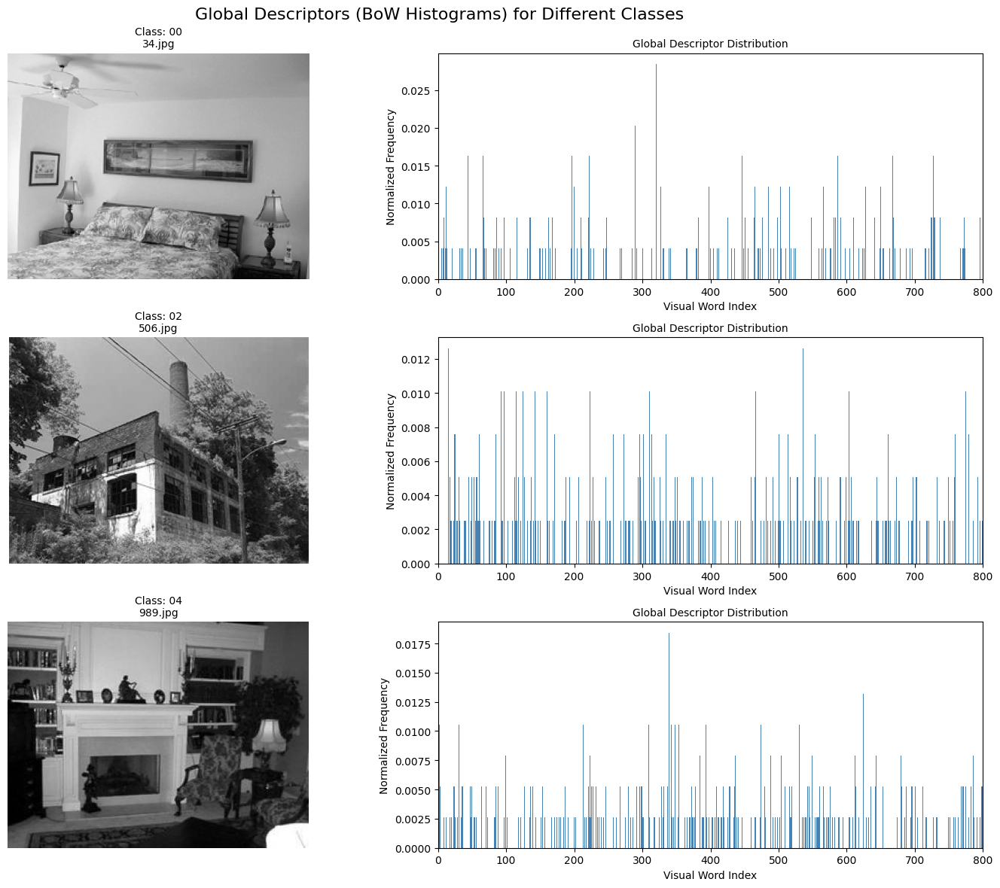

In [8]:
num_words = 800

def compute_bow_histogram(img_path, codebook, kp_detector):
    img = cv2.imread(img_path)
    points, descriptors = kp_detector.detectAndCompute(img, mask=None)
    
    if descriptors is None or len(descriptors) == 0:
        return np.zeros(num_words)
    
    labels = codebook.predict(descriptors)
    
    histogram = np.zeros(num_words)
    for label in labels:
        histogram[label] += 1
    
    if np.sum(histogram) > 0:
        histogram = histogram / np.sum(histogram)
    
    return histogram

print("Indexing test dataset...")
test_descriptors = []
t1 = cv2.getTickCount()

for i in range(len(test_set)):
    img_file = data_path + test_set_label[i] + "/" + test_set[i]
    histogram = compute_bow_histogram(img_file, kmeans, kp)
    test_descriptors.append(histogram)

t2 = cv2.getTickCount()
time = (t2 - t1) / cv2.getTickFrequency()

test_descriptors = np.array(test_descriptors)
print(f"Test set indexed: {test_descriptors.shape[0]} images")
print(f"Global descriptor dimension: {test_descriptors.shape[1]}")
print(f"Average indexing time per image: {round((1000*time)/len(test_set), 2)} ms")

print("\n=== Showing Global Descriptors for Different Classes ===")
f, axes = plt.subplots(3, 2, figsize=(15, 12))
f.suptitle('Global Descriptors (BoW Histograms) for Different Classes', fontsize=16)

# 1 image per class
displayed_classes = []
sample_indices = []
for i in range(len(test_set)):
    if test_set_label[i] not in displayed_classes:
        displayed_classes.append(test_set_label[i])
        sample_indices.append(i)
    if len(sample_indices) >= 6:  
        break

for idx, test_idx in enumerate(sample_indices):
    row = idx // 2
    col = idx % 2
    
    if col == 0:
        img_file = data_path + test_set_label[test_idx] + "/" + test_set[test_idx]
        img = cv2.imread(img_file)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[row, 0].imshow(img_rgb)
        axes[row, 0].set_title(f"Class: {test_set_label[test_idx]}\n{test_set[test_idx]}", fontsize=10)
        axes[row, 0].axis('off')
        
        axes[row, 1].bar(range(num_words), test_descriptors[test_idx], width=1.0, color='steelblue')
        axes[row, 1].set_xlabel('Visual Word Index')
        axes[row, 1].set_ylabel('Normalized Frequency')
        axes[row, 1].set_title(f'Global Descriptor Distribution', fontsize=10)
        axes[row, 1].set_xlim([0, num_words])

plt.tight_layout()
plt.show()

### QUESTION:
Describe the method you use and display
the representation of your global descriptor for some images of different classes.

ANSWER:

*representation of some images above*

To index the dataset, we first extract the descriptors of the input image, then, we use our k-means model to assign each of these extracted descriptors to a certain cluster from our k-means codebook, and finally, we construct the histogram of counts of these words in the codebook, which is basically the index of our image.
For training image, these are stored for later use. 

On inference, we compute the histogram of the image and query our database to find the most similar one, according to a metric (see below)

# V - Testing CBIR: Retrieving Similar Images

For the evaluation, we will proceed with testing different retrieval metrics (see cell directly below) and analyze their performance based on the most popular evaluation metrics.

In [9]:
# HELPER FUNCTIONS
def euclidean_distance(h1, h2):
    """Classic approach"""
    return np.sqrt(np.sum((h1 - h2)**2))

def manhattan_distance(h1, h2):
    """For variety"""
    return np.sum(np.abs(h1 - h2))

def chi_square_distance(h1, h2):
    """Common for historgrams as it is more robust"""
    eps = 1e-10 
    return np.sum((h1 - h2)**2 / (h1 + h2 + eps))

def histogram_intersection(h1, h2):
    """Measures overlap between histograms"""
    intersection = np.sum(np.minimum(h1, h2))
    return 1.0 - intersection

def cosine_distance(h1, h2):
    """Angle between two vectors, popular in text retrieval"""
    dot_product = np.dot(h1, h2)
    norm1 = np.linalg.norm(h1)
    norm2 = np.linalg.norm(h2)
    if norm1 == 0 or norm2 == 0:
        return 1.0
    cosine_sim = dot_product / (norm1 * norm2)
    return 1.0 - cosine_sim


In [10]:

def retrieve_similar_images(query_idx, test_descriptors, distance_metric='chi_square', top_k=7): #can change default but i wanted nice 2x4 alignment below
    """Computes distances for the query given a specific metric (one of the distances above), and returns top_k results"""
    query_descriptor = test_descriptors[query_idx]
    distances = []
    if distance_metric == 'euclidean':
        dist_func = euclidean_distance
    elif distance_metric == 'manhattan':
        dist_func = manhattan_distance
    elif distance_metric == 'chi_square':
        dist_func = chi_square_distance
    elif distance_metric == 'cosine':
        dist_func = cosine_distance
    elif distance_metric == 'hist_intersection':
        dist_func = histogram_intersection
    else:
        raise ValueError("CHECK SPELLING")
    
    for i in range(len(test_descriptors)):
        dist = dist_func(query_descriptor, test_descriptors[i])
        distances.append((i, dist))
    
    distances.sort(key=lambda x: x[1])
    
    results = []
    for idx, dist in distances:
        if idx != query_idx or len(results) == 0:
            results.append((idx, dist))
        if len(results) >= top_k:
            break
    
    return results


=== CBIR Query ===
Query image: 478.jpg
Query class: 02
Query index: 102

--- Using chi_square distance ---


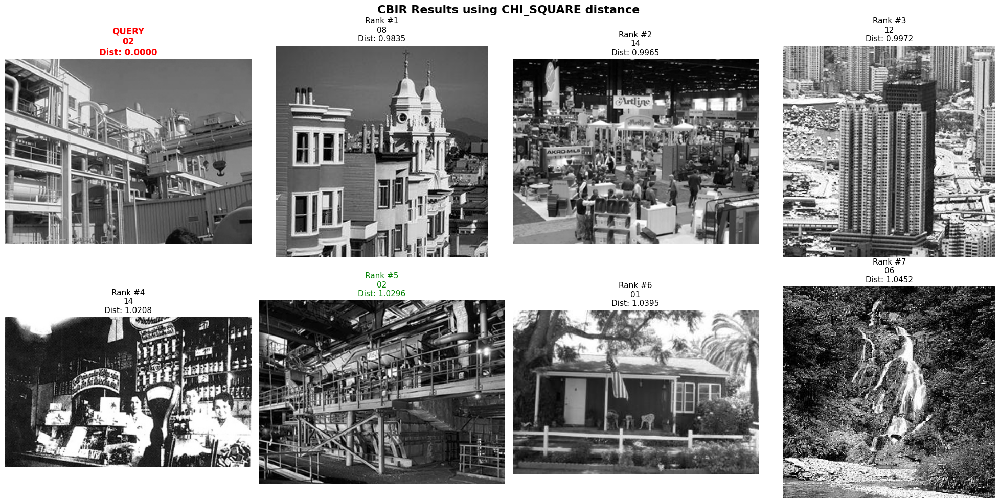

Precision@7: 14.29% (1/7 retrieved images are from correct class)

--- Using euclidean distance ---


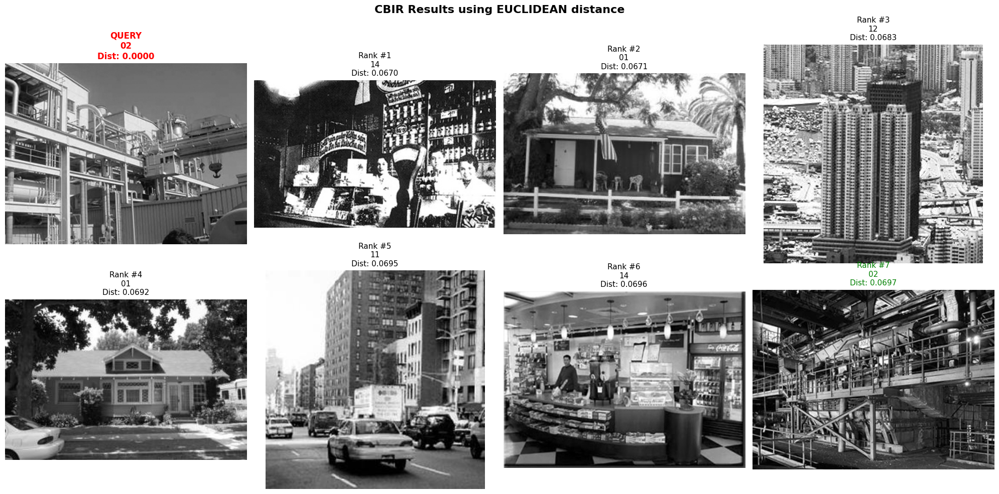

Precision@7: 14.29% (1/7 retrieved images are from correct class)

--- Using cosine distance ---


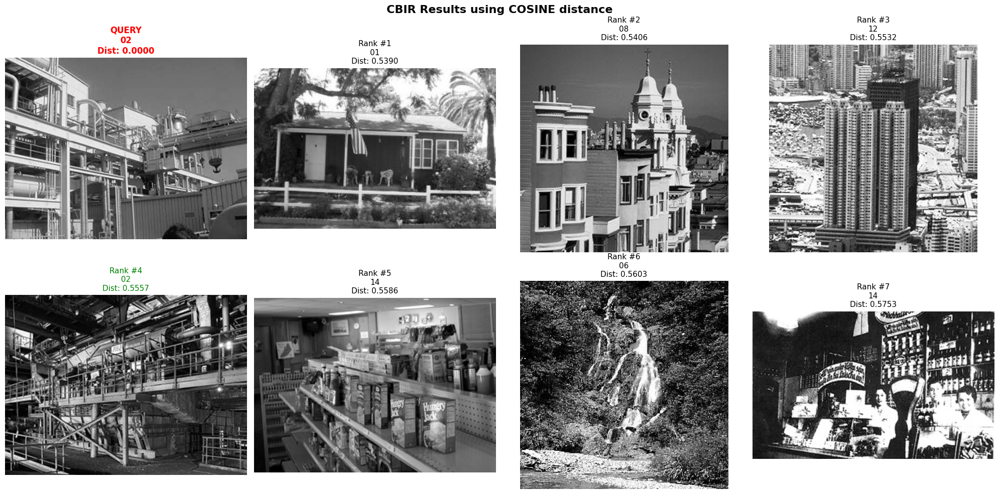

Precision@7: 14.29% (1/7 retrieved images are from correct class)

--- Using hist_intersection distance ---


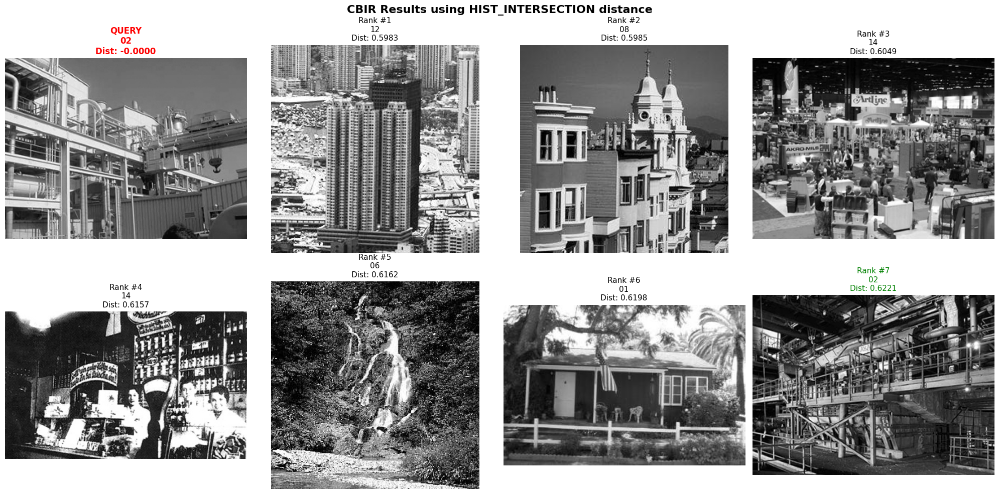

Precision@7: 14.29% (1/7 retrieved images are from correct class)


In [11]:
np.random.seed(42)  # for reproducibility
query_idx = np.random.randint(0, len(test_set))

print(f"=== CBIR Query ===")
print(f"Query image: {test_set[query_idx]}")
print(f"Query class: {test_set_label[query_idx]}")
print(f"Query index: {query_idx}")

#testing all metrics
metrics = ['chi_square', 'euclidean', 'cosine', 'hist_intersection']

for metric in metrics:
    print(f"\n--- Using {metric} distance ---")
    # 8 topk for nice display
    results = retrieve_similar_images(query_idx, test_descriptors, distance_metric=metric, top_k=8)
    
    # results
    f, axes = plt.subplots(2, 4, figsize=(20, 10))
    f.suptitle(f'CBIR Results using {metric.upper()} distance', fontsize=16, fontweight='bold')
    
    for i, (img_idx, distance) in enumerate(results[:8]):
        row = i // 4
        col = i % 4
        img_file = data_path + test_set_label[img_idx] + "/" + test_set[img_idx]
        img = cv2.imread(img_file)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[row, col].imshow(img_rgb)
        
        if i == 0:
            title = f"QUERY\n{test_set_label[img_idx]}\nDist: {distance:.4f}"
            axes[row, col].set_title(title, fontsize=12, fontweight='bold', color='red')
        else:
            title = f"Rank #{i}\n{test_set_label[img_idx]}\nDist: {distance:.4f}"
            color = 'green' if test_set_label[img_idx] == test_set_label[query_idx] else 'black' #green is good, black not
            axes[row, col].set_title(title, fontsize=11, color=color)
        
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    #precision@ computation, will do smth better below
    retrieved_images = results[1:8]  
    correct = sum(1 for idx, _ in retrieved_images if test_set_label[idx] == test_set_label[query_idx])
    num_retrieved = len(retrieved_images)  
    precision = correct / num_retrieved if num_retrieved > 0 else 0
    print(f"Precision@{num_retrieved}: {precision:.2%} ({correct}/{num_retrieved} retrieved images are from correct class)")

### COMMENT

Above we see some retrieved images and precision@7 computation, while informative, it is not the best metric to use since it doesnt take into account the position of the correctly retreived images in the ranking. Thus, we proceed with better metrics below.

The above output is mostly for initial visualization of the retrieval.

We will use precision@k as before, recall@k, accuracy, confusion matrix and, most importantly, MAP.

QUANTITATIVE EVALUATION OF CBIR SYSTEM

Distance Metric: CHI_SQUARE
Evaluating CBIR system with chi_square distance...
Total queries: 681

Top-1 Accuracy: 26.73%
Mean Average Precision (MAP): 0.3522

Precision@K:
  P@1: 26.73%
  P@5: 22.58%
  P@10: 21.16%

Recall@K:
  R@1: 0.60%
  R@5: 2.50%
  R@10: 4.69%

Distance Metric: EUCLIDEAN
Evaluating CBIR system with euclidean distance...
Total queries: 681

Top-1 Accuracy: 19.82%
Mean Average Precision (MAP): 0.2672

Precision@K:
  P@1: 19.82%
  P@5: 15.36%
  P@10: 13.96%

Recall@K:
  R@1: 0.44%
  R@5: 1.70%
  R@10: 3.09%

Distance Metric: COSINE
Evaluating CBIR system with cosine distance...
Total queries: 681

Top-1 Accuracy: 29.22%
Mean Average Precision (MAP): 0.3630

Precision@K:
  P@1: 29.22%
  P@5: 22.53%
  P@10: 20.56%

Recall@K:
  R@1: 0.65%
  R@5: 2.50%
  R@10: 4.53%

Distance Metric: HIST_INTERSECTION
Evaluating CBIR system with hist_intersection distance...
Total queries: 681

Top-1 Accuracy: 27.17%
Mean Average Precision (MAP): 

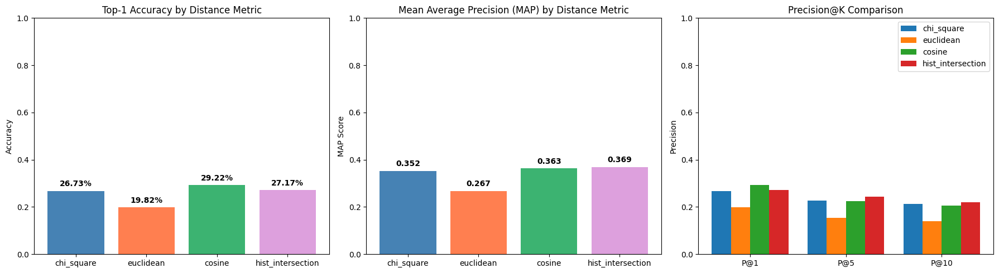


BEST PERFORMING METRIC: HIST_INTERSECTION
MAP Score: 0.3691


In [ ]:
# Quantitative Evaluation Functions

def average_precision(relevant_flags):
    if sum(relevant_flags) == 0:
        return 0.0
    
    precisions = []
    num_relevant = 0
    
    for i, is_relevant in enumerate(relevant_flags):
        if is_relevant:
            num_relevant += 1
            precision_at_i = num_relevant / (i + 1)
            precisions.append(precision_at_i)
    
    return np.mean(precisions) if precisions else 0.0

def evaluate_cbir_system(test_descriptors, test_labels, distance_metric='chi_square', k_values=[1, 5, 10]):
    n_images = len(test_descriptors)
    
    class_counts = {}
    for label in test_labels:
        class_counts[label] = class_counts.get(label, 0) + 1
    
    precisions = {k: [] for k in k_values}
    recalls = {k: [] for k in k_values}
    average_precisions = []
    top1_correct = 0
    
    unique_classes = sorted(list(set(test_labels)))
    confusion = np.zeros((len(unique_classes), len(unique_classes)), dtype=int)
    class_to_idx = {cls: i for i, cls in enumerate(unique_classes)}
    
    print(f"Evaluating CBIR system with {distance_metric} distance...")
    print(f"Total queries: {n_images}")
    
    # Evaluate each image as query
    for query_idx in range(n_images):
        query_class = test_labels[query_idx]
        
        # Retrieve similar images
        max_k = max(k_values) + 1  # +1 to account for query itself
        results = retrieve_similar_images(query_idx, test_descriptors, 
                                         distance_metric=distance_metric, 
                                         top_k=max_k)
        
        # Remove query from results
        results = [(idx, dist) for idx, dist in results if idx != query_idx]
        
        # Top-1 accuracy
        if len(results) > 0:
            top1_class = test_labels[results[0][0]]
            if top1_class == query_class:
                top1_correct += 1
            
            # Update confusion matrix
            confusion[class_to_idx[query_class], class_to_idx[top1_class]] += 1
        
        # Precision@K and Recall@K
        for k in k_values:
            if len(results) >= k:
                top_k_results = results[:k]
                relevant = [test_labels[idx] == query_class for idx, _ in top_k_results]
                
                # Precision
                precision = sum(relevant) / k
                precisions[k].append(precision)
                
                # Recall
                num_relevant_in_db = class_counts[query_class] - 1  # -1 for query itself
                recall = sum(relevant) / num_relevant_in_db if num_relevant_in_db > 0 else 0
                recalls[k].append(recall)
        
        # Average Precision (for MAP)
        if len(results) > 0:
            relevant_flags = [test_labels[idx] == query_class for idx, _ in results[:20]]  # Consider top 20
            ap = average_precision(relevant_flags)
            average_precisions.append(ap)
    
    # Aggregate results
    metrics = {
        'top1_accuracy': top1_correct / n_images,
        'mean_average_precision': np.mean(average_precisions),
        'confusion_matrix': confusion,
        'class_names': unique_classes
    }
    
    for k in k_values:
        metrics[f'precision@{k}'] = np.mean(precisions[k])
        metrics[f'recall@{k}'] = np.mean(recalls[k])
    
    return metrics

# Evaluate system with different distance metrics
print("="*70)
print("QUANTITATIVE EVALUATION OF CBIR SYSTEM")
print("="*70)

evaluation_results = {}
metrics_to_test = ['chi_square', 'euclidean', 'cosine', 'hist_intersection']

for metric in metrics_to_test:
    print(f"\n{'='*70}")
    print(f"Distance Metric: {metric.upper()}")
    print(f"{'='*70}")
    
    results = evaluate_cbir_system(test_descriptors, test_set_label, 
                                   distance_metric=metric, 
                                   k_values=[1, 5, 10])
    evaluation_results[metric] = results
    
    print(f"\nTop-1 Accuracy: {results['top1_accuracy']:.2%}")
    print(f"Mean Average Precision (MAP): {results['mean_average_precision']:.4f}")
    print(f"\nPrecision@K:")
    for k in [1, 5, 10]:
        print(f"  P@{k}: {results[f'precision@{k}']:.2%}")
    print(f"\nRecall@K:")
    for k in [1, 5, 10]:
        print(f"  R@{k}: {results[f'recall@{k}']:.2%}")

# Compare metrics visually with nice prints
print("\n" + "="*70)
print("COMPARISON OF DISTANCE METRICS")
print("="*70)

f, axes = plt.subplots(1, 3, figsize=(18, 5))

# top 1 plot
metric_names = list(evaluation_results.keys())
top1_accuracies = [evaluation_results[m]['top1_accuracy'] for m in metric_names]
axes[0].bar(metric_names, top1_accuracies, color=['steelblue', 'coral', 'mediumseagreen', 'plum'])
axes[0].set_ylabel('Accuracy')
axes[0].set_title('Top-1 Accuracy by Distance Metric')
axes[0].set_ylim([0, 1])
for i, v in enumerate(top1_accuracies):
    axes[0].text(i, v + 0.02, f'{v:.2%}', ha='center', fontweight='bold')

# map plot
map_scores = [evaluation_results[m]['mean_average_precision'] for m in metric_names]
axes[1].bar(metric_names, map_scores, color=['steelblue', 'coral', 'mediumseagreen', 'plum'])
axes[1].set_ylabel('MAP Score')
axes[1].set_title('Mean Average Precision (MAP) by Distance Metric')
axes[1].set_ylim([0, 1])
for i, v in enumerate(map_scores):
    axes[1].text(i, v + 0.02, f'{v:.3f}', ha='center', fontweight='bold')

# precision@K plot
k_values = [1, 5, 10]
x = np.arange(len(k_values))
width = 0.2
for i, metric in enumerate(metric_names):
    precisions = [evaluation_results[metric][f'precision@{k}'] for k in k_values]
    axes[2].bar(x + i*width, precisions, width, label=metric)
axes[2].set_ylabel('Precision')
axes[2].set_title('Precision@K Comparison')
axes[2].set_xticks(x + width * 1.5)
axes[2].set_xticklabels([f'P@{k}' for k in k_values])
axes[2].legend()
axes[2].set_ylim([0, 1])

plt.tight_layout()
plt.show()

best_metric = max(evaluation_results.keys(), key=lambda m: evaluation_results[m]['mean_average_precision'])
print(f"\n{'='*70}")
print(f"BEST PERFORMING METRIC: {best_metric.upper()}")
print(f"MAP Score: {evaluation_results[best_metric]['mean_average_precision']:.4f}")
print(f"{'='*70}")

### COMMENT

With the metrics above in mind, we see clearly that in general, histogram intersection is the best distance metric for retrieving from our KAZE-based BoW.
Thus, we analyze this metric further with a confusion matrix, analysis of most confused pairs, and finally, per-class accuracy.

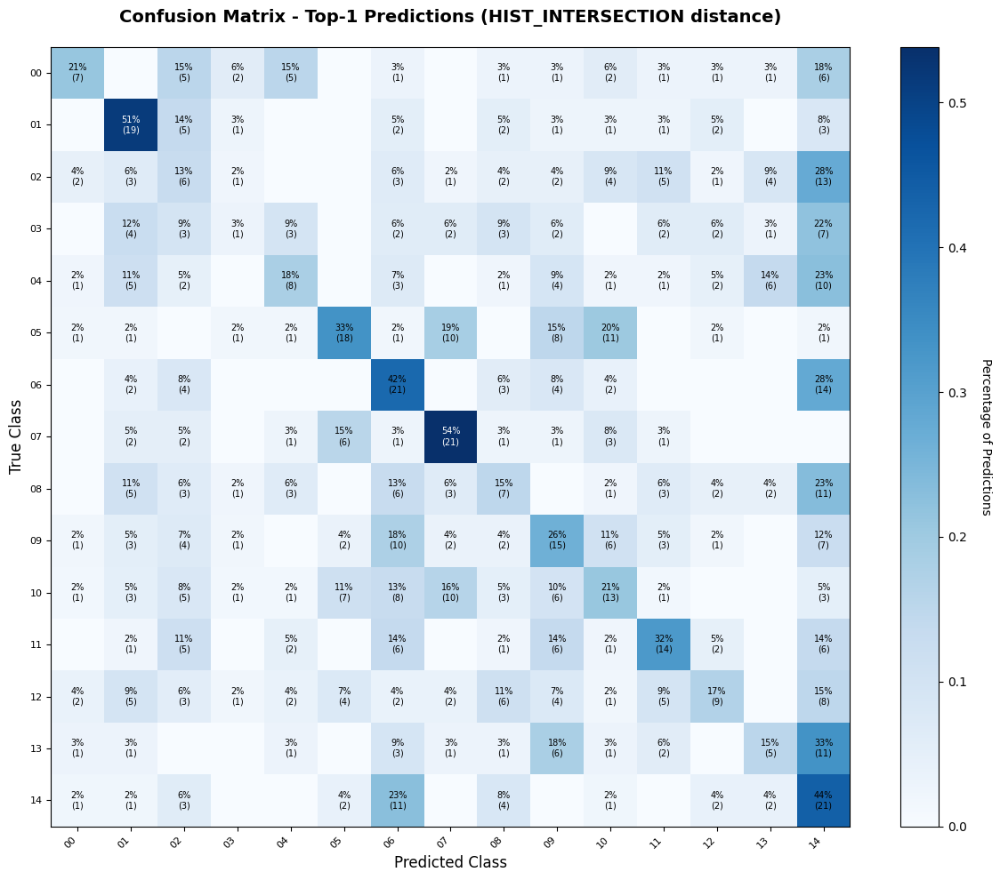


MOST CONFUSED CLASS PAIRS

Top 10 most frequent misclassifications:
True Class           Predicted As         Count      Percentage
----------------------------------------------------------------------
06                   14                   14         28.0%
02                   14                   13         27.7%
05                   10                   11         20.4%
08                   14                   11         23.4%
13                   14                   11         33.3%
14                   06                   11         22.9%
04                   14                   10         22.7%
05                   07                   10         18.5%
09                   06                   10         17.5%
10                   07                   10         16.1%

PER-CLASS ACCURACY

Class                     Accuracy        Correct/Total
----------------------------------------------------------------------
07                        53.8%             21/39
01      

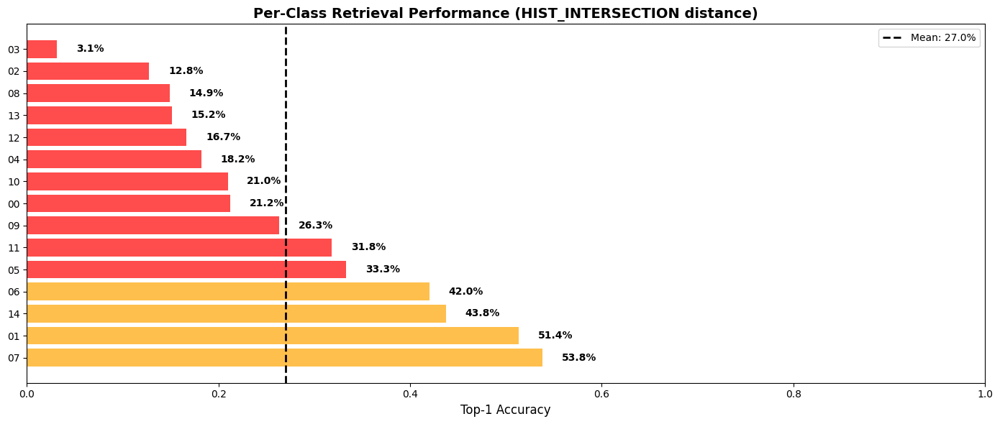

In [ ]:

import matplotlib.colors as mcolors

best_metric = max(evaluation_results.keys(), 
                  key=lambda m: evaluation_results[m]['mean_average_precision'])

confusion_matrix = evaluation_results[best_metric]['confusion_matrix']
class_names = evaluation_results[best_metric]['class_names']

# normalzie
confusion_normalized = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]

# CM plot
fig, ax = plt.subplots(figsize=(12, 10))
im = ax.imshow(confusion_normalized, cmap='Blues', aspect='auto')

ax.set_xticks(np.arange(len(class_names)))
ax.set_yticks(np.arange(len(class_names)))
ax.set_xticklabels(class_names, rotation=45, ha='right', fontsize=8)
ax.set_yticklabels(class_names, fontsize=8)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Percentage of Predictions', rotation=270, labelpad=20)

for i in range(len(class_names)):
    for j in range(len(class_names)):
        if confusion_matrix[i, j] > 0:
            text = ax.text(j, i, f'{confusion_normalized[i, j]:.0%}\n({confusion_matrix[i, j]})',
                          ha="center", va="center", 
                          color="white" if confusion_normalized[i, j] > 0.5 else "black",
                          fontsize=7)

ax.set_title(f'Confusion Matrix - Top-1 Predictions ({best_metric.upper()} distance)', 
             fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Predicted Class', fontsize=12)
ax.set_ylabel('True Class', fontsize=12)

plt.tight_layout()
plt.show()

# most confused pairs
print("\n" + "="*70)
print("MOST CONFUSED CLASS PAIRS")
print("="*70)

confusions = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if i != j and confusion_matrix[i, j] > 0:
            confusions.append((class_names[i], class_names[j], 
                             confusion_matrix[i, j], confusion_normalized[i, j]))

confusions.sort(key=lambda x: x[2], reverse=True)

print("\nTop 10 most frequent misclassifications:")
print(f"{'True Class':<20} {'Predicted As':<20} {'Count':<10} {'Percentage'}")
print("-"*70)
for true_class, pred_class, count, pct in confusions[:10]:
    print(f"{true_class:<20} {pred_class:<20} {count:<10} {pct:.1%}")

# accuracy
print("\n" + "="*70)
print("PER-CLASS ACCURACY")
print("="*70)
class_accuracies = []
for i, class_name in enumerate(class_names):
    total = confusion_matrix[i, :].sum()
    correct = confusion_matrix[i, i]
    accuracy = correct / total if total > 0 else 0
    class_accuracies.append((class_name, accuracy, correct, total))

class_accuracies.sort(key=lambda x: x[1], reverse=True)

print(f"\n{'Class':<25} {'Accuracy':<15} {'Correct/Total'}")
print("-"*70)
for class_name, acc, correct, total in class_accuracies:
    print(f"{class_name:<25} {acc:.1%}             {correct}/{total}")

fig, ax = plt.subplots(figsize=(14, 6))
classes = [c[0] for c in class_accuracies]
accs = [c[1] for c in class_accuracies]
colors = ['green' if a >= 0.7 else 'orange' if a >= 0.4 else 'red' for a in accs]

bars = ax.barh(classes, accs, color=colors, alpha=0.7)
ax.set_xlabel('Top-1 Accuracy', fontsize=12)
ax.set_title(f'Per-Class Retrieval Performance ({best_metric.upper()} distance)', 
             fontsize=14, fontweight='bold')
ax.set_xlim([0, 1])
ax.axvline(x=np.mean(accs), color='black', linestyle='--', linewidth=2, label=f'Mean: {np.mean(accs):.1%}')
ax.legend()

for i, (bar, acc) in enumerate(zip(bars, accs)):
    ax.text(acc + 0.02, i, f'{acc:.1%}', va='center', fontweight='bold')

plt.tight_layout()
plt.show()

### COMMENT

We see above that our classifier does struggle with certain classes, however, if we use the random guess as a benchmark, anything above 6.6% is good for us, and we see that the random guess is only better for class 03

# Appendix - Evaluation metric descriptions:


### 1. **Precision@K**
- Proportion of relevant images among top K retrieved results
- Best: 1.0 (all retrieved images are relevant)
- Not really good when ranking order is important

### 2. **Recall@K** 
- Proportion of all relevant images that were retrieved in top K
- Indicates completeness of retrieval

### 3. **Mean Average Precision (MAP)**
- Average of precision values at each relevant result position
- Considers ranking quality, not just presence
- Best metric for overall system performance
- We opt to use this one for evaluation retrieval distances.

### 4. **Confusion Matrix**
- Shows predicted class and true class
- Helps identify problematic class pairs

### 5. **Top-1 Accuracy**
- Percentage of queries where nearest neighbor is correct class
- Simple but effective metric

